In [1]:
!pip install torch==1.9.0+cu102 -f https://download.pytorch.org/whl/torch_stable.html

Looking in links: https://download.pytorch.org/whl/torch_stable.html


In [2]:
import torch
from torch.nn import Module,ModuleList,Conv2d,BatchNorm2d,ReLU,Sequential,ConvTranspose2d,Sigmoid,L1Loss
import torchvision.models as models
import torch.nn.functional as F
import cv2
import numpy as np
import os
from torch.optim import Adam
from torch.utils.data import DataLoader
from tqdm import tqdm
import zipfile



In [3]:
url='/content/drive/MyDrive/Digest/segementationdata.zip'
with zipfile.ZipFile(url) as zf:
       for member in tqdm(zf.infolist(), desc='Extracting '):
             zf.extract(member, './')

Extracting : 100%|██████████| 67101/67101 [09:48<00:00, 113.96it/s] 


In [4]:
loss=L1Loss()
input = torch.randn(3, 5, requires_grad=True)
target = torch.randn(3, 5)
output = loss(input, target)
print(input,target,output)

tensor([[ 1.2585, -0.4964,  0.6496, -0.8221,  2.2923],
        [ 1.0646,  2.4120,  0.0578,  0.0218,  1.6134],
        [ 0.6783,  0.1196,  0.6111,  0.0981, -1.1272]], requires_grad=True) tensor([[-1.0599,  0.6876, -0.6450, -1.1539,  1.4479],
        [-1.3284, -0.5120, -0.8346,  0.0972,  0.5653],
        [ 2.3699,  1.6885, -0.9418,  0.7999,  0.2862]]) tensor(1.3490, grad_fn=<L1LossBackward>)


In [5]:
print(torch.mean(torch.abs(input - target)))

tensor(1.3490, grad_fn=<MeanBackward0>)


In [6]:

class Convolutional_Block(Module):
  def __init__(self,indim,outdim,kernel,pad=0):

    super().__init__()

    self.conv = Conv2d(in_channels=indim, out_channels=outdim, kernel_size=kernel,padding=pad)
    self.bn = BatchNorm2d(outdim)
    self.relu = ReLU()

  def forward(self, x):
     x = self.conv(x)
     x = self.bn(x)
     x = self.relu(x)
     return x

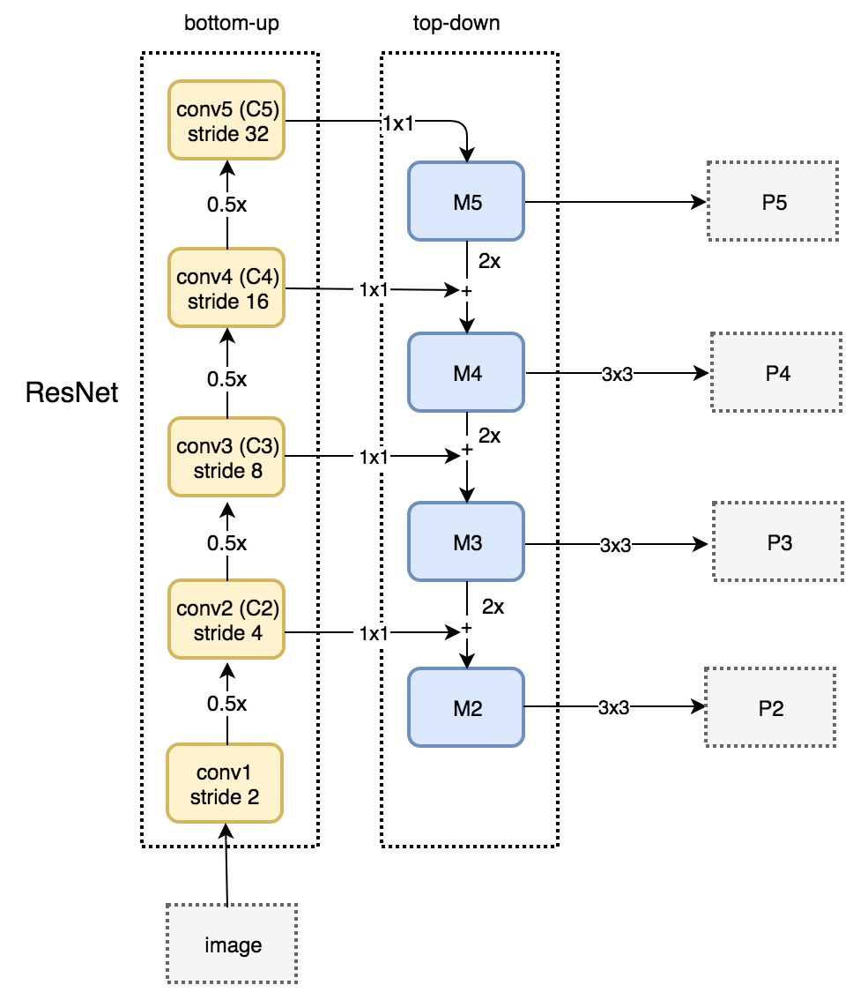

In [7]:
    
class Feature_Pyramid_Network(Module):
  def __init__(self,fpn_dim=256):
        super().__init__()
        features=[64,128,256,512]
        # 1x1 for converting all level feature to same dimension for adding
        # 3x3 for smoothening after merging two features

        self.pyr2=Convolutional_Block(features[0],fpn_dim,1)
        self.pyr2_m=Convolutional_Block(fpn_dim,fpn_dim,3,1)# pad 1 so kernel 3 will not change (h,w) dimension of feature

        self.pyr3=Convolutional_Block(features[1],fpn_dim,1)
        self.pyr3_m=Convolutional_Block(fpn_dim,fpn_dim,3,1)

        self.pyr4=Convolutional_Block(features[2],fpn_dim,1)
        self.pyr4_m=Convolutional_Block(fpn_dim,fpn_dim,3,1)

        self.pyr5=Convolutional_Block(features[3],fpn_dim,1)
        self.pyr5_m=Convolutional_Block(fpn_dim,fpn_dim,3,1)

        self.fpnconv=Convolutional_Block(fpn_dim*4,fpn_dim,3,1)

  def forward(self,features):

        x2,x3,x4,x5=features   
        P5=self.pyr5(x5)
        P5=self.pyr5_m(P5)
        temp=F.interpolate(P5,size=x4.shape[2:])

        P4=self.pyr4(x4)+temp
        P4=self.pyr4_m(P4)
        temp=F.interpolate(P4,size=x3.shape[2:])
        
        P3=self.pyr3(x3)+temp
        P3=self.pyr3_m(P3)
        temp=F.interpolate(P3,size=x2.shape[2:])
        
        P2=self.pyr2(x2)+temp
        P2=self.pyr2_m(P2)
        
        
      
        
        h,w=x2.shape[2:]
        P3 = F.interpolate(P3, size=(h, w))
        P4 = F.interpolate(P4, size=(h, w))
        P5 = F.interpolate(P5, size=(h, w))


        final= torch.cat([P2, P3, P4, P5], dim=1) # adding in features dimension

        y=self.fpnconv(final)

        return y


In [8]:

#“pred” consists of a 3×3 convolutional operator and two de-convolutional operators with stride 2
def DB_pred(dim):
  return  Sequential(
            Conv2d(dim, dim // 4, 3, padding=1),
            BatchNorm2d(dim // 4),
            ReLU(inplace=True),
            ConvTranspose2d(dim // 4, dim // 8, 2, 2),
            BatchNorm2d(dim // 8),
            ReLU(inplace=True),
            ConvTranspose2d(dim // 8, 1, 2, 2),
            Sigmoid())


In [9]:
def interpolate(op_maps,size):
  return  [F.interpolate(map, size=size) for map in op_maps]


In [31]:

class dbnet(Module):
  def __init__(self):
    super().__init__()
        
    backbone=models.resnet18(pretrained=True)
    modules = list(backbone.children())[:-2]
    self.backbone=ModuleList(modules)

    self.fpn=Feature_Pyramid_Network(256)
    self.pred_prob=DB_pred(256)
    self.pred_thresh=DB_pred(256)
    self.K=50 #paper

    self.l1=L1Loss()

  def dice(self,prediction,label):

    # dice loss
    # 2 * intersection  => 2 * (pred * label)
    # _________________
    #
    # Union + intersection ==> pred+label
    smooth = 1

    iflat = prediction.view(-1)
    tflat = label.view(-1)
    intersection = (iflat * tflat).sum()
    
    return 1 - ((2. * intersection + smooth) /
              (iflat.sum() + tflat.sum() + smooth))


  def dbloss(self,prediction,groundtruth):

    #probmap,threshmap,binarymap=prediction

    """
    
    
    binloss=1-bindice
    probloss=1-self.dice(probmap,groundtruth)

    threshloss=self.l1(threshmap,groundtruth)"""
    

    """L = Ls + α × Lb + β × Lt (7)
        where Ls is the loss for the probability map and Lb is the
        loss for the binary map. According to the numeric values of
        the losses, α and β are set to 1.0 and 10 respectively"""
        
    #loss= probloss+1.0*binloss +10*threshloss
    bindice=self.dice(prediction,groundtruth)
    return bindice,1-bindice






  def forward(self,image):

    features=[]
    x=image
    for i,layer in enumerate(self.backbone):
      x=layer(x)
      if(i in {4,5,6,7}):
        features.append(x)

    concat_enhanced_features=self.fpn(features)   
    probmap=self.pred_prob(concat_enhanced_features)
    threshmap=self.pred_thresh(concat_enhanced_features)

    binarymap=torch.div(1,1+torch.exp(-self.K*(probmap-threshmap))) # paper formula

    #op=interpolate([probmap,threshmap,binarymap],image.shape[2:])

    return binarymap

    

In [45]:
"""
def preprocess(image):

        sh=min(image.shape[:2])
        if(sh>1024):
            rat=1024/sh
            sha=[int(i*rat) for i in image.shape[:2]]
            image=cv2.resize(image,tuple(sha[::-1]))

        mean = [0.485, 0.456, 0.406]
        std = [0.229, 0.224, 0.225]

        image = image.astype(np.float32)
        image /= 255.
        image -= mean
        image /= std

        if(len(image.shape)==3):
            image=np.expand_dims(image,0)

        if(image.shape[-1]==3):
            image=np.transpose(image,(0,3,1,2))

        return image

def preprocess_mask(mask):
  
    if(len(mask.shape)==2):
              mask=np.expand_dims(mask,-1)

    sh=min(mask.shape[:2])

    if(sh>1024):
        rat=1024/sh
        sha=[int(i*rat) for i in mask.shape[:2]]
        mask=cv2.resize(mask,tuple(sha[::-1]))   
               
    if(len(mask.shape)==3):
              mask=np.expand_dims(mask,0)
    if(mask.shape[-1]==1):
        mask=np.transpose(mask,(0,3,1,2))


    return mask """   

def preprocess(image):

        image=cv2.resize(image,(768,768))

        mean = [0.485, 0.456, 0.406]
        std = [0.229, 0.224, 0.225]

        image = image.astype(np.float32)
        image /= 255.
        image -= mean
        image /= std

        

        if(image.shape[-1]==3):
            image=np.transpose(image,(2,0,1))

        return image

def preprocess_mask(mask):
  
    if(len(mask.shape)==2):
              mask=np.expand_dims(mask,-1)


    mask=cv2.resize(mask,(768,768))   
    mask = cv2.cvtColor(mask, cv2.COLOR_BGR2GRAY)
    mask =np.expand_dims (mask,0)          
   
    if(mask.shape[-1]==1):
        mask=np.transpose(mask,(2,0,1))


    return mask


In [46]:
from google.colab.patches import cv2_imshow

In [47]:

class generator():
  def __init__(self,image,masks,shuffle=False):
    self.imgpth=image
    self.mskpth=masks
    self.images=os.listdir(image)
    self.masks=os.listdir(masks)
   

    self.shuffle=shuffle
  def __len__(self):
      return len(self.masks)
  def __getitem__(self,index):

    record=self.masks[index]

    image=cv2.imread(self.imgpth+record)
    masks=cv2.imread(self.mskpth+record)
    masks = cv2.blur(masks, (5,5))
    _, masks = cv2.threshold(masks, 127, 255,	cv2.THRESH_BINARY_INV)
    """
    cv2_imshow(image)
    cv2_imshow(masks)
    print("asdadasda")"""
    norm_img=preprocess(image)
    norm_mask=preprocess_mask(masks)/255

    return {
               "X":torch.tensor(norm_img,dtype=torch.float32),
               "mask":torch.tensor(norm_mask,dtype=torch.float32)
                            
               }   



In [48]:
def avg(x):
  return sum(x)/len(x)
class pipeline():

    def __init__(self,model,processing_unit):
        
     self.device = torch.device(processing_unit)
     self.model=model
     self.model.to(self.device)
    
    def set_optimizer(self,optimizer,lr=0.00001):
     if(optimizer=='Adam'):
      self.optim = Adam(self.model.parameters(), lr=lr)

    def fit(self,data_generator,epochs,batch_size,save_best=False):
     self.generator= data_generator
     train_data_loader = DataLoader(data_generator, batch_size=batch_size,shuffle=True, num_workers=1)
     best_acc = 0
     for epoch in range(epochs):
                 
                 final_loss=0
                 final_acc=0
                 checkloss=[]
                 checkacc=[]
                 t=tqdm(train_data_loader,total=len(train_data_loader))
                 
                 for data in t:
                       for key,value in data.items():
                             data[key]=value.to(self.device)
                       self.optim.zero_grad()
                       inp,target=data['X'],data['mask']
                       op=self.model(inp)
                       
                       loss,acc=self.model.dbloss(op,target)
                       #acc=self.model.accuracy(op,target)
           
                       
                       loss.backward()
                       self.optim.step()
                       checkloss.append(loss.item() )
                       checkacc.append(acc.item())    
                       string="epoch  "+str(epoch)+"   loss: {:.4f}".format(avg(checkloss))+"   accuracy: {:.4f}".format(avg(checkacc))  
                       t.set_description(string)
                       t.refresh() 
                       final_loss+=loss.item() 
                       final_acc+=acc.item()       
                           
                                
                                
                
              




                 print("epoch :  ",epoch,"loss :  ",final_loss/len(train_data_loader),"  accuracy :  ",final_acc/len(train_data_loader))
                 if final_acc > best_acc:
                   if(save_best):
                           torch.save(self.model.state_dict(),save_best)
                   best_acc = final_acc
    def evaluate(self,data_generator,batch_size):
     self.generator= data_generator
     eval_data_loader = DataLoader(data_generator, batch_size=batch_size,shuffle=True, num_workers=1)
                 
     final_loss=0
     final_acc=0
     checkloss=[]
     checkacc=[]
     t=tqdm(eval_data_loader,total=len(eval_data_loader))
     self.model.eval()
     for data in t:
          for key,value in data.items():
                data[key]=value.to(self.device)
          inp,target=data['X'],data['mask']
          with torch.no_grad():
            op=self.model(inp)
          
          loss,acc=self.model.dbloss(op,target)
          checkloss.append(loss.item() )
          checkacc.append(acc.item())    
          string="evaluating  "+"   loss: {:.4f}".format(avg(checkloss))+"   accuracy: {:.4f}".format(avg(checkacc))  
          t.set_description(string)
          t.refresh() 
          final_loss+=loss.item() 
          final_acc+=acc.item()   
          del loss
          del acc       
                  
  





     print("loss :  ",final_loss/len(eval_data_loader),"  accuracy :  ",final_acc/len(eval_data_loader))
    


In [49]:
if __name__ == '__main__':    

    component=dbnet()
    pth="/content/segementationdata"
    component.load_state_dict(torch.load("/content/drive/MyDrive/Digest/detection.pth"))  
    train=generator(pth+'/train/image/',pth+'/train/mask/')
    val=generator(pth+'/validate/image/',pth+'/validate/mask/')
    
    
    model=pipeline(component, "cuda")
    model.set_optimizer('Adam')
    model.fit(train,1,16,"/content/drive/MyDrive/Digest/test.pth")


epoch  0   loss: 0.0063   accuracy: 0.9937: 100%|██████████| 1855/1855 [38:40<00:00,  1.25s/it]


epoch :   0 loss :   0.006331738757315993   accuracy :   0.993668261242684


In [ ]:
model.evaluate(val,20)


In [ ]:
!nvidia-smi

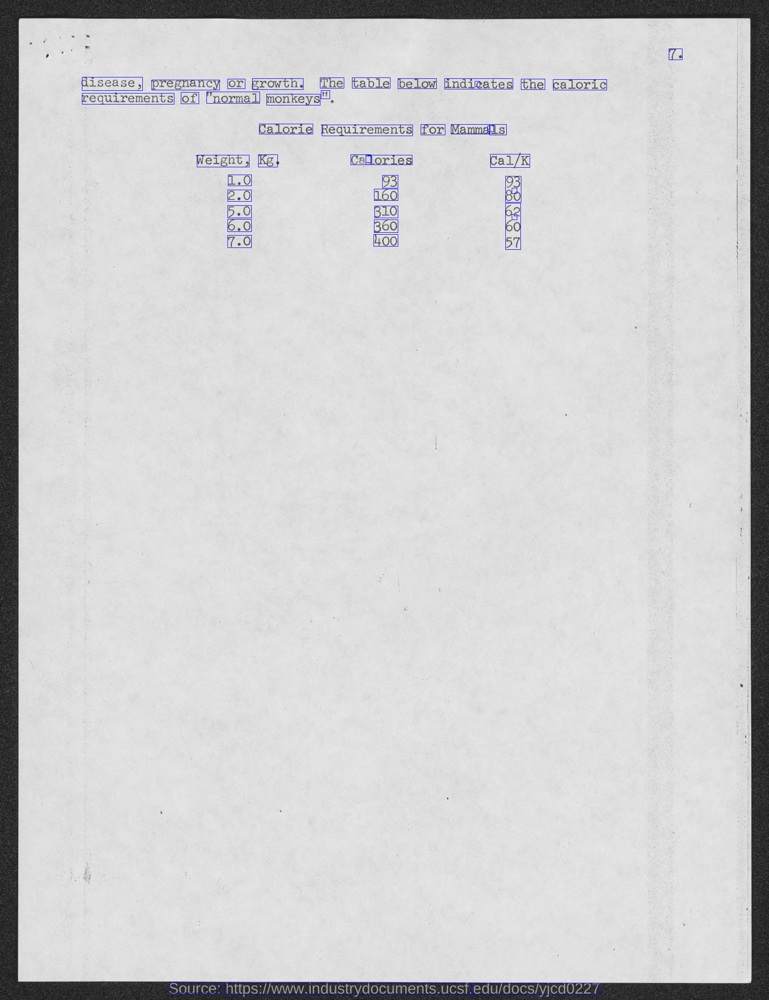

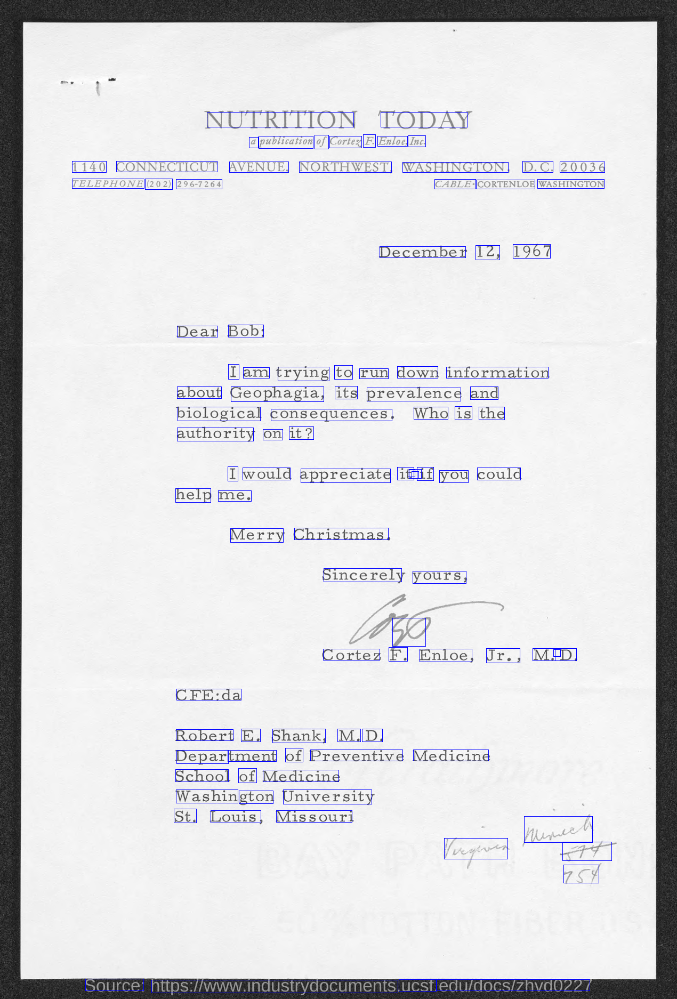

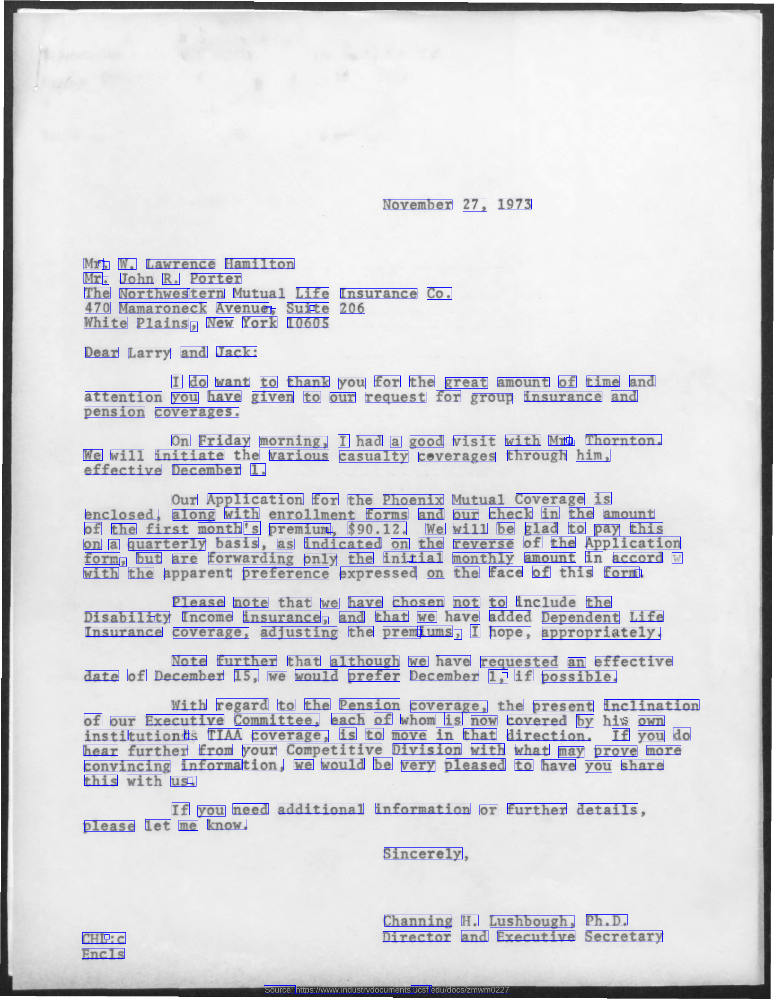

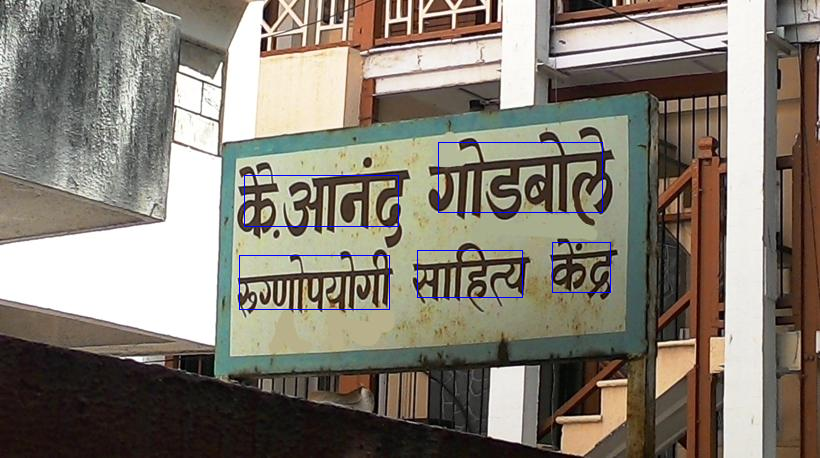

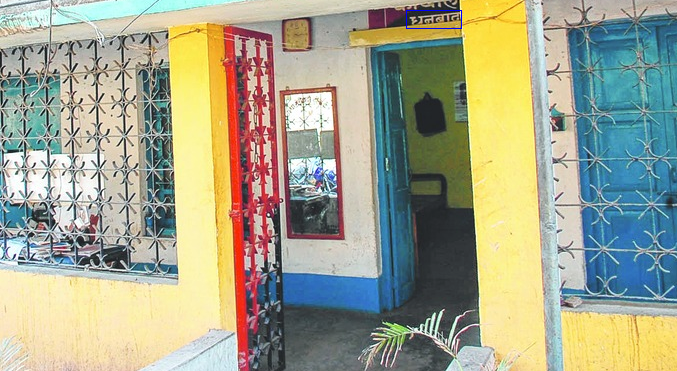

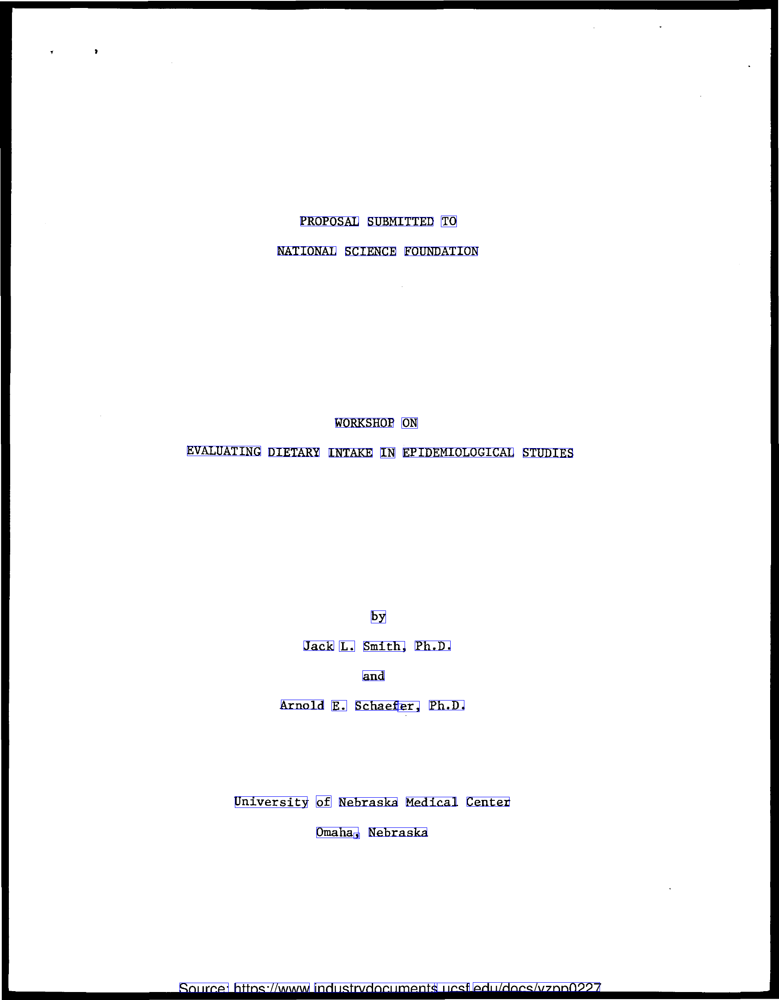

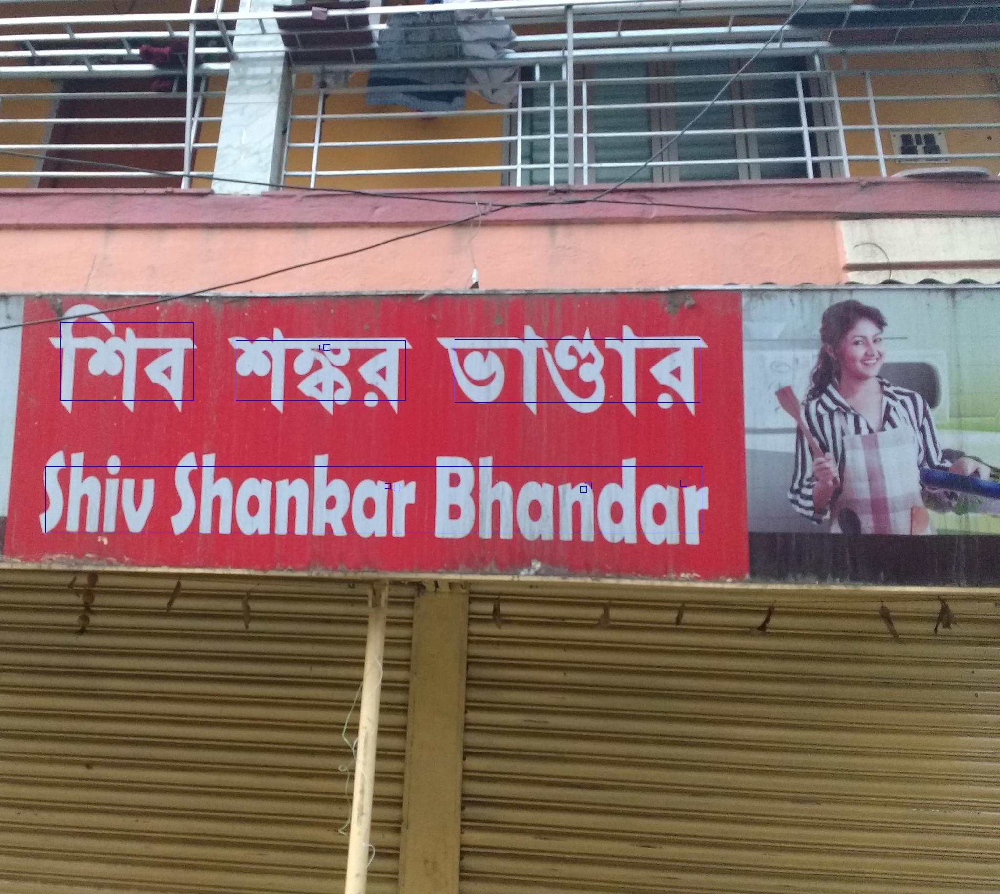

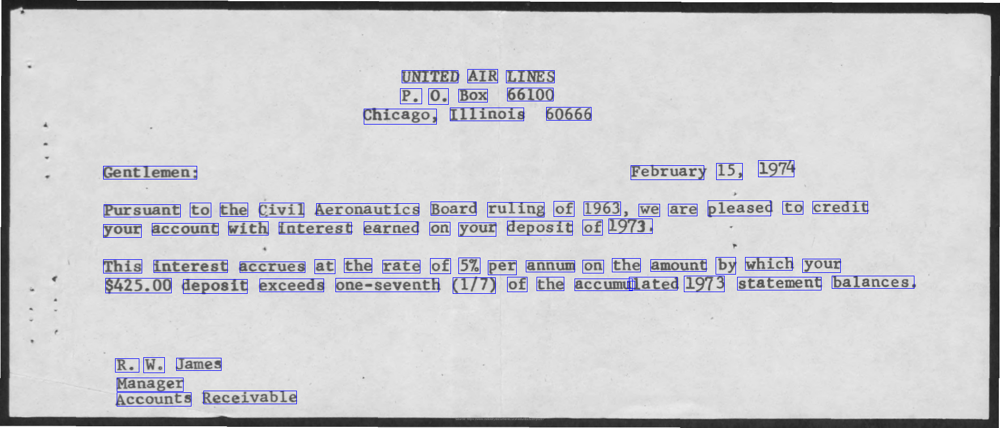

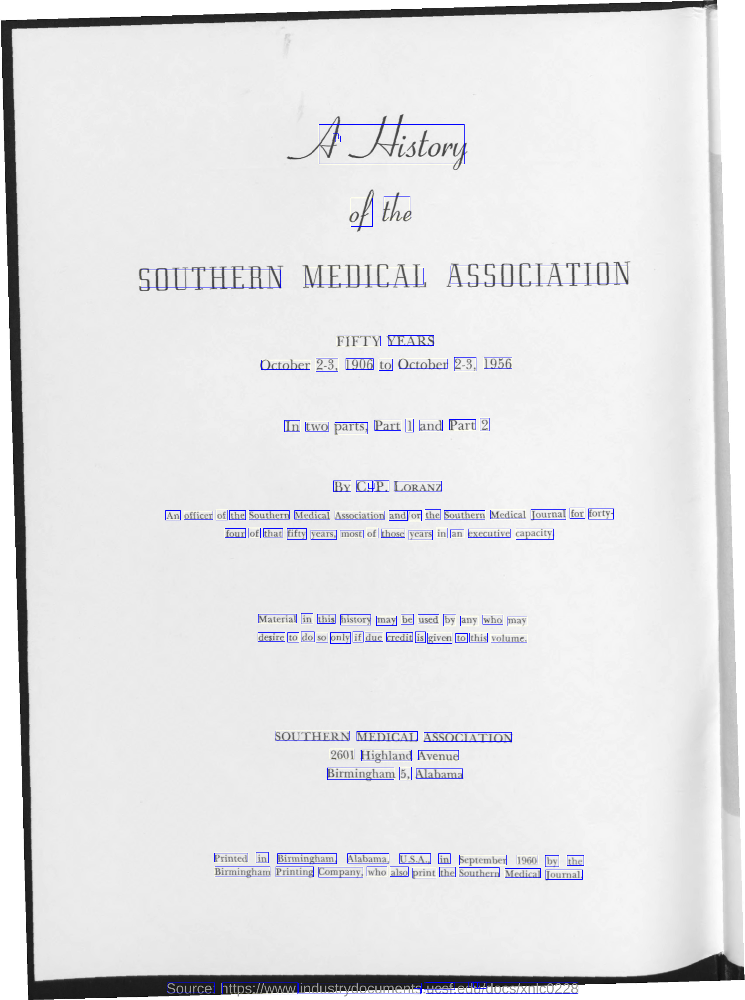

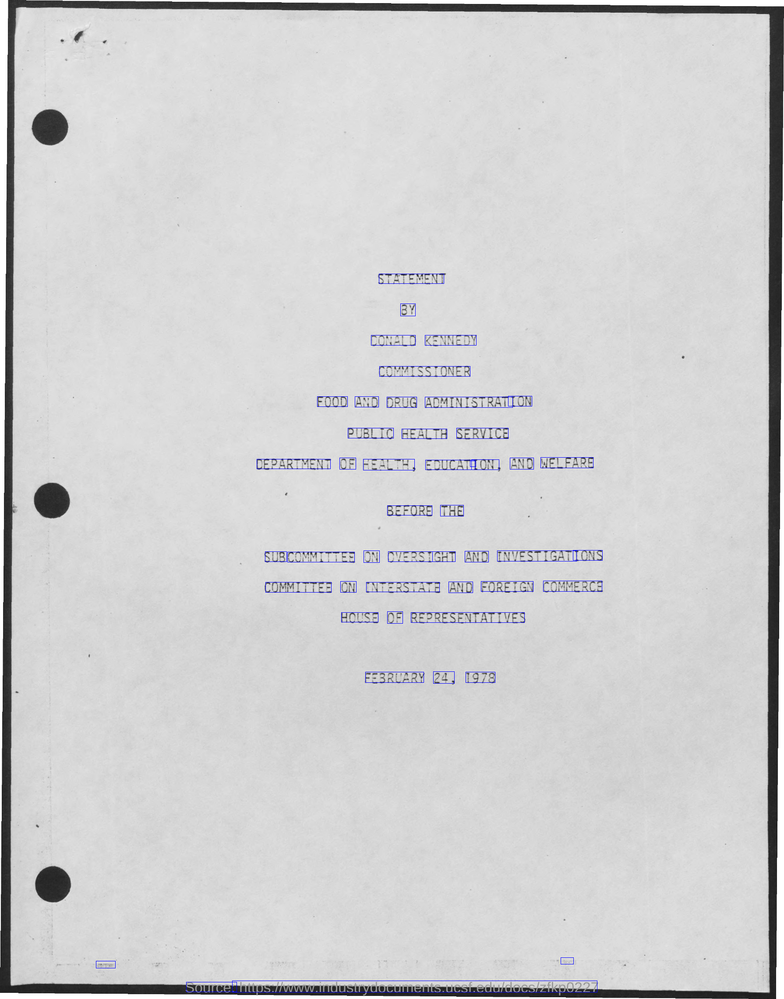

In [41]:
def preprocess(image):

        #image=cv2.resize(image,(640,640))

        mean = [0.485, 0.456, 0.406]
        std = [0.229, 0.224, 0.225]

        image = image.astype(np.float32)
        image /= 255.
        image -= mean
        image /= std

        

        if(image.shape[-1]==3):
            image=np.transpose(image,(2,0,1))

        return image
model.model.eval()
model.model.to("cpu")
images=os.listdir(pth+'/validate/image/')
masks=os.listdir(pth+'/validate/mask/')

for i in range(10):
  img=cv2.imread(pth+'/validate/image/'+images[i])
  
  predmap=model.model(torch.unsqueeze(torch.tensor(preprocess(img),dtype=torch.float32),0))[0][0].detach().numpy()
  prediction=(predmap* 255).astype(np.uint8)
  prediction=cv2.imread(pth+'/validate/mask/'+images[i])
  #prediction=(cv2.threshold(predimg, 200, 255,	cv2.THRESH_BINARY_INV)[-1])
  prediction=cv2.resize(prediction,img.shape[:-1][::-1])
  contours, _ = cv2.findContours(prediction, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
  for contour in contours:
    (x,y,w,h) = cv2.boundingRect(contour)
    cv2.rectangle(img, (x-5,y-5), (x+w+5,y+h+5), (255, 0, 0), 1)
  cv2_imshow(img)
  #cv2_imshow(prediction_img)


In [ ]:
epoch :   99 loss :   0.07692226436403063   accuracy :   0.923077735635
0.853731612364451


In [ ]:
x=dbnet()
x(torch.rand(1,3,512,512))[0].shape

In [ ]:
backbone = models.resnet18()
print(list(backbone.children())[-2])

In [ ]:


[1 2 3 4 5]
[2 3 4 5 6]
[1 2 3 4 5]
[2 3 4 5 6]



(5,1)

(6,5)   matmul  (5,1)   (6,1)
(1,5)  matmul   (5,1)   (1,1)

[3 4 5 6 7]



In [ ]:
noq=int(input())
def isprim(x):
    for i in range(2, int(num/2)+1):
 
        if (num % i) == 0:
            return False
    else:
        return True
def ispal(x):
    return str(x)==str(x)[::-1]
for i in range(noq):
    x=input()
    z=[int(m) for m in x.split()]
    for k in range(z[0],z[1]):
        count=0
        if(ispal(k) and ispri(k)):
            count+=1
        print(count)    